# Car Brand Detector App

We are now going to look at more basic constructs of FastAI (though not all of it). Constructs when it comes to loading **data** using the DataBlock API. A lego-brick's approach to building your own dataloader.

For this task, I'll export our trained model & **deploy** a running app to do inference (prediction). The dataset is going to be images of cars for 3 famous car brands: *Toyota, Chevrolet, & BMW*. 

**Bing Image Search API** is a service I'll use to obtain the images' URLs and then download them.

And for our web app, we are going to use **Binder!**

You can find my app running here [LINK](https://mybinder.org/v2/gh/isados/car-recognition-app/HEAD?filepath=gui.ipynb), but you'll probably have to wait a while for it to launch :D

**Now, let's dive in!**

## Installation

In [ ]:
!pip install --upgrade fastai fastbook
import wave
import contextlib
import math
import os 

import pandas as pd
import numpy as np

from pathlib import Path

from fastbook import *
from fastai.vision.widgets import *

     |████████████████████████████████| 186 kB 27.8 MB/s 
     |████████████████████████████████| 720 kB 58.4 MB/s 
     |████████████████████████████████| 56 kB 4.2 MB/s 
     |████████████████████████████████| 1.2 MB 34.8 MB/s 
     |████████████████████████████████| 46 kB 4.0 MB/s 
     |████████████████████████████████| 51 kB 268 kB/s 
  Attempting uninstall: fastai
    Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


## Scraping Images using Bing Search

INSERT YOUR API KEY for XXXXX

For further instructions, refer to this [forum post](https://forums.fast.ai/t/getting-the-bing-image-search-key/67417)

In [ ]:

key = os.environ.get('AZURE_SEARCH_KEY', 'XXXXXXXXXXXXXXXXX')
key = os.environ.get('AZURE_SEARCH_KEY', 'c7578f74c64049e499f46e668eb7ce79')

**Let's look at a Toyota car**

In [ ]:
results = search_images_bing(key, 'toyota')
ims = results.attrgot('contentUrl')
f"There are {len(ims)} images from our search"

'There are 150 images from our search'

In [ ]:
ims[1]

'https://s1.cdn.autoevolution.com/images/gallery/TOYOTA-Fortuner-6076_13.jpg'

In [ ]:
dest = 'images/toyota.jpg'
download_url(ims[1], dest)

Path('images/toyota.jpg')

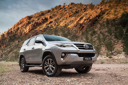

In [ ]:
im = Image.open(dest)
im.to_thumb(128,128)

Let's now look at more 2 more car brands and download them all of it into a working folder

In [ ]:
car_types = 'toyota','chevrolet','bmw'
path = Path('cars')

In [ ]:
if not path.exists():
    path.mkdir()
    for o in car_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [ ]:
fns = get_image_files(path)
fns

(#445) [Path('cars/toyota/00000102.jpeg'),Path('cars/toyota/00000120.jpg'),Path('cars/toyota/00000148.jpg'),Path('cars/toyota/00000082.jpg'),Path('cars/toyota/00000054.jpg'),Path('cars/toyota/00000051.jpg'),Path('cars/toyota/00000041.jpg'),Path('cars/toyota/00000118.jpg'),Path('cars/toyota/00000049.jpg'),Path('cars/toyota/00000065.jpg')...]

There are a few images that are corrupt when we download them, so let's remove them using the `verify_images` function

In [ ]:
failed = verify_images(fns)
failed

(#0) []

`failed` has all the images that are **corrupt**, so let's delete them

In [ ]:
failed.map(Path.unlink);

## Dataloaders from DataBlock

We use the DataBlock API to build our dataloaders from a **lower level**

`ImageBlock` refers to our input type

`CategoryBlock` refers to our output type

In [ ]:
cars = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
dls = cars.dataloaders(path)

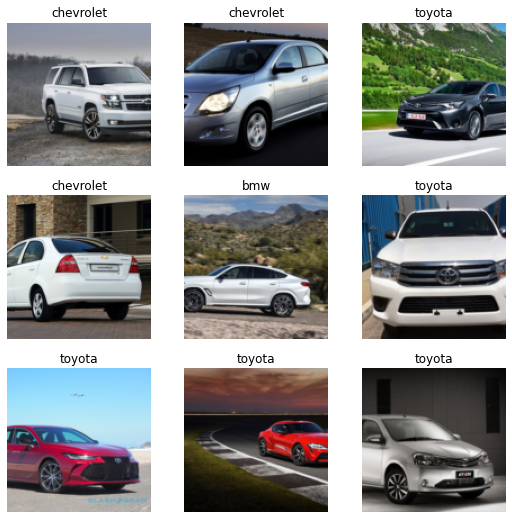

In [ ]:
dls.show_batch()

Let's *squish* the photos instead of cropping it on the sides. We update `item_tfms` attribute in the DataBlock

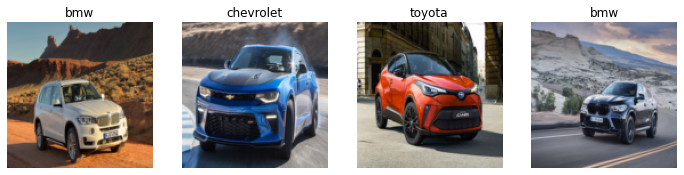

In [ ]:
cars = cars.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = cars.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

We could instead pad the top part of the images with zeros to resize them.

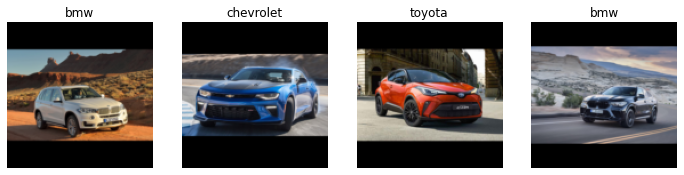

In [ ]:
cars = cars.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = cars.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

Perhaps, we are modifying the images too much. Augmentation is helpful insofar as it explains the data well and doesn't misconstrue it. We could randomly crop certain parts of the image so it meets our required size using `RandomResizedCrop`

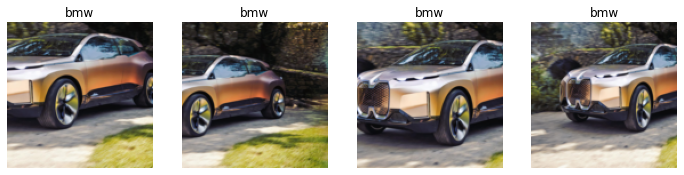

In [ ]:
cars = cars.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = cars.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1023: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  /pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:760.)
  ret = func(*args, **kwargs)


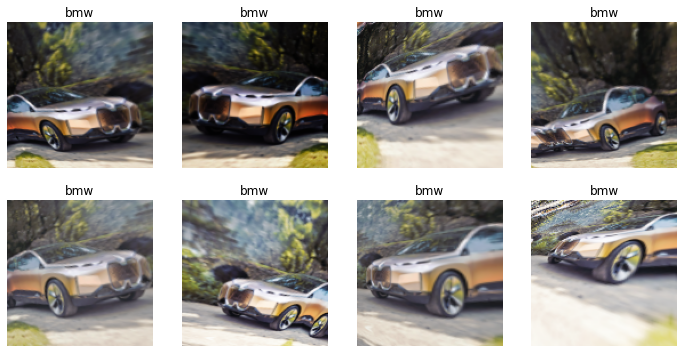

In [ ]:
cars = cars.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = cars.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Training & Evaluation

Alright, now for our model. We will use two kinds of transforms. First is the item-by-item transform to resize the images first, and then using an available augmentation transforms (`aug_transforms`) method that augments a batch of images at a time.

In [ ]:
cars = cars.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = cars.dataloaders(path)

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1023: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  /pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:760.)
  ret = func(*args, **kwargs)


In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(8)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


epoch,train_loss,valid_loss,error_rate,time
0,1.876909,1.755561,0.674157,01:23


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,1.330903,1.160971,0.505618,01:54
1,1.292743,1.019926,0.415730,01:49
2,1.169542,0.930050,0.415730,01:53
3,1.039677,0.956624,0.382022,01:49
4,0.952404,0.983680,0.382022,01:52
5,0.865229,0.979322,0.359551,01:49
6,0.791211,0.940118,0.337079,01:51
7,0.703019,0.937843,0.337079,01:49


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency e

With 8 epochs of fine-tuning, got an error rate of **33.7%**

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


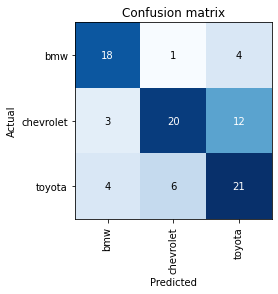

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

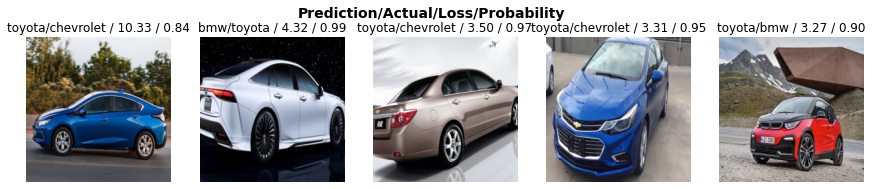

In [ ]:
interp.plot_top_losses(5, nrows=1)

## Cleaning V.2

We do have some wrong set of images, that don't make sense to include in the dataset. So let's remove them.

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Now's let delete them after selection

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

## Turning our Model into an Online App

The following command saves the architecture along with the learned parameters to a file called `export.pkl`

In [ ]:
learn.export()
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
load_learner

<function fastai.learner.load_learner>

In [ ]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('images/toyota.jpg')

('toyota', tensor(2), tensor([3.0649e-04, 1.1257e-03, 9.9857e-01]))

In [ ]:
learn_inf.dls.vocab

['bmw', 'chevrolet', 'toyota']

#### RUN ONLY ON COLAB
Let's download it for Google Colab, so our exported model can be stored within the repo.

In [ ]:
from google.colab import files
files.download('export.pkl') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Final Notes

Now that I know that the model has been saved, 
we are going to leverage Voila (a python package that turns your notebook into a GUI from a Jupyter Notebook), you can see our sourcecode for that on the [`gui.ipynb`](gui.ipynb) notebook within this repo.

The app is going to be run on Binder where you can upload an image, and will output a labelled prediction along with its probability.

Chow!